<a href="https://colab.research.google.com/github/marcomedugno/marcomedugno/blob/main/Visualizaton%2C_Splitting_Data%2C_%26_Lin_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## Marco Medugno

In [ ]:
# displays output inline
%matplotlib inline

Load the [California housing dataset](https://scikit-learn.org/stable/datasets/real_world.html#california-housing-dataset)
# Exploratory Data Analysis (EDA)

In [ ]:
# load Ames, Iowa housing dataset
from sklearn.datasets import fetch_california_housing
california = fetch_california_housing(as_frame=True)


In [ ]:
# display type and keys of dict
print("Type of %s dataset: %s" % ("California housing", type(california)))
print("Keys: %s" % california.keys)
print("Keys: %s" % california.keys())


Type of California housing dataset: <class 'sklearn.utils.Bunch'>
Keys: <built-in method keys of Bunch object at 0x7ffa060ae950>
Keys: dict_keys(['data', 'target', 'frame', 'target_names', 'feature_names', 'DESCR'])


In [ ]:
# display key target_names
print("Target name: %s" % california["target_names"])
print("Target name: %s" % california.target_names)

Target name: ['MedHouseVal']
Target name: ['MedHouseVal']


In [ ]:
#display key DESCR
print(california.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived

In [ ]:
# default dataframe
california.frame

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847


In [ ]:
# interactive dataframe (up to 20000 rows)
from google.colab import data_table
data_table.enable_dataframe_formatter()
california.frame.head(20000)

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
19995,1.0349,6.0,4.165217,0.982609,734.0,3.191304,36.19,-119.35,0.678
19996,2.8152,27.0,6.142029,1.081159,1268.0,3.675362,36.16,-119.45,1.069
19997,2.3882,21.0,5.625767,1.231084,1496.0,3.059305,36.16,-119.35,0.492
19998,2.0313,18.0,5.440000,1.093333,253.0,3.373333,36.09,-119.45,1.125


In [ ]:
# check for missing values in columns
california.frame.isnull().sum()

MedInc         0
HouseAge       0
AveRooms       0
AveBedrms      0
Population     0
AveOccup       0
Latitude       0
Longitude      0
MedHouseVal    0
dtype: int64

In [ ]:
# report data types of columns
california.frame.dtypes

MedInc         float64
HouseAge       float64
AveRooms       float64
AveBedrms      float64
Population     float64
AveOccup       float64
Latitude       float64
Longitude      float64
MedHouseVal    float64
dtype: object

In [ ]:
# report descriptive statistics
california.frame.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


# Visualization

(array([  62.,   62.,  435.,  160.,  175.,  411.,  264.,  492.,  302.,
         412., 1283.,  698.,  570.,  967.,  446.,  847.,  478.,  566.,
        1107.,  471.,  461.,  934.,  565., 1304.,  824.,  862.,  931.,
         369.,  304.,  664.,  353.,  650.,  245.,  198.,  311.,  136.,
        1321.]),
 array([ 1.        ,  2.37837838,  3.75675676,  5.13513514,  6.51351351,
         7.89189189,  9.27027027, 10.64864865, 12.02702703, 13.40540541,
        14.78378378, 16.16216216, 17.54054054, 18.91891892, 20.2972973 ,
        21.67567568, 23.05405405, 24.43243243, 25.81081081, 27.18918919,
        28.56756757, 29.94594595, 31.32432432, 32.7027027 , 34.08108108,
        35.45945946, 36.83783784, 38.21621622, 39.59459459, 40.97297297,
        42.35135135, 43.72972973, 45.10810811, 46.48648649, 47.86486486,
        49.24324324, 50.62162162, 52.        ]),
 <a list of 37 Patch objects>)

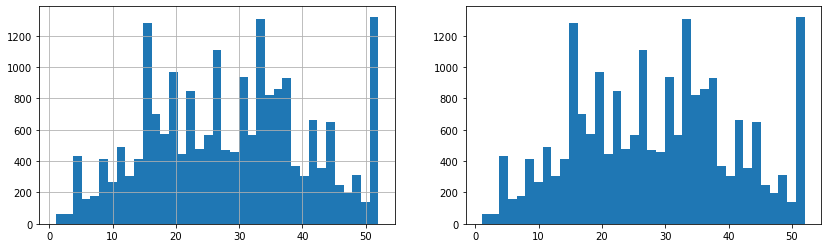

In [ ]:
# display histogram on house age in MatPlotLib
import matplotlib.pyplot as plt
plt.figure(figsize=(14,4))
plt.subplot(121)
california.frame.HouseAge.hist(bins=37)
plt.subplot(122)
plt.hist(california.frame.HouseAge, bins=37)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


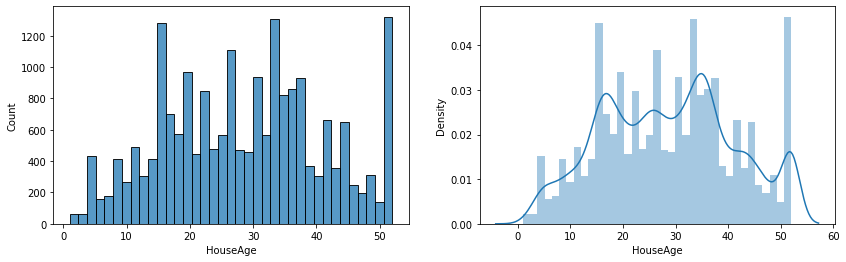

In [ ]:
# display histogram and distribution on house age in Seaborn
import seaborn as sn
plt.figure(figsize=(14,4))
plt.subplot(121)
sn.histplot(california.frame.HouseAge)
plt.subplot(122)
sn.distplot(california.frame.HouseAge)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ffa03f71250>,
      dtype=object)

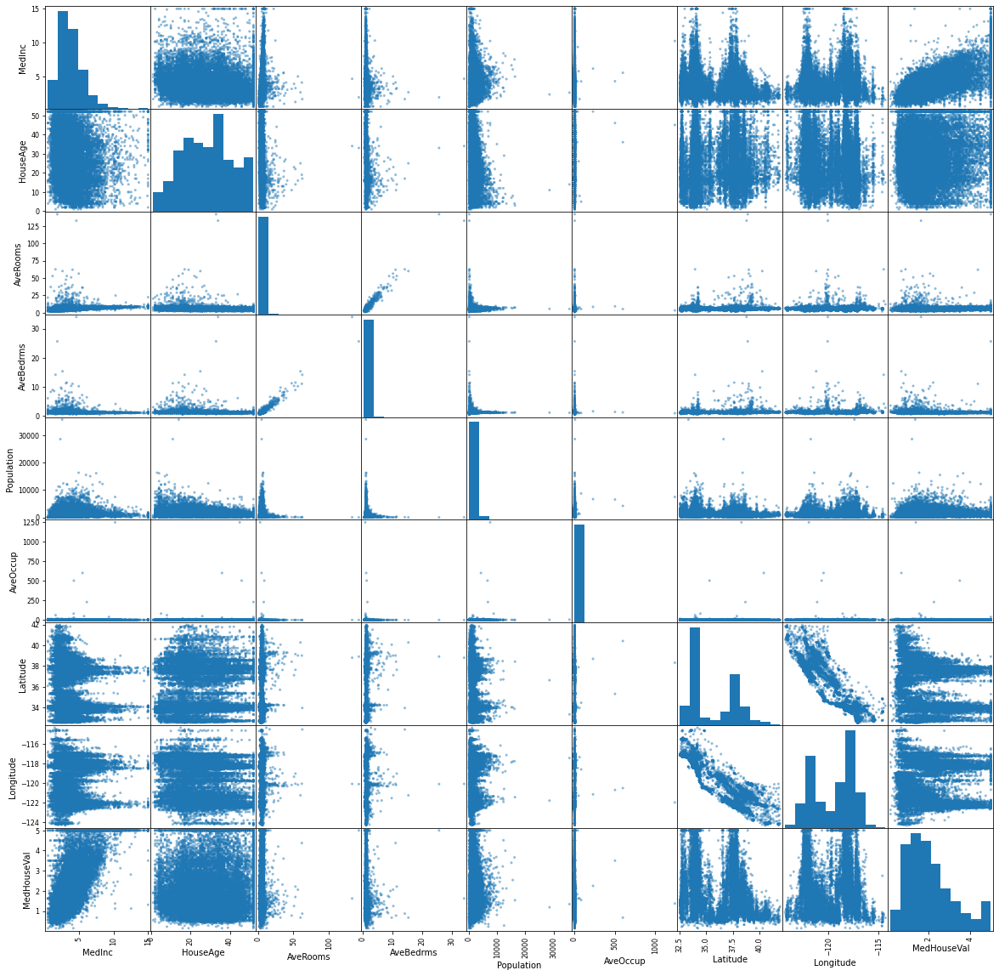

In [ ]:
# display pairwise plots in pandas
import pandas as pd
pd.plotting.scatter_matrix(california.frame, figsize=(20, 20), diagonal='hist')

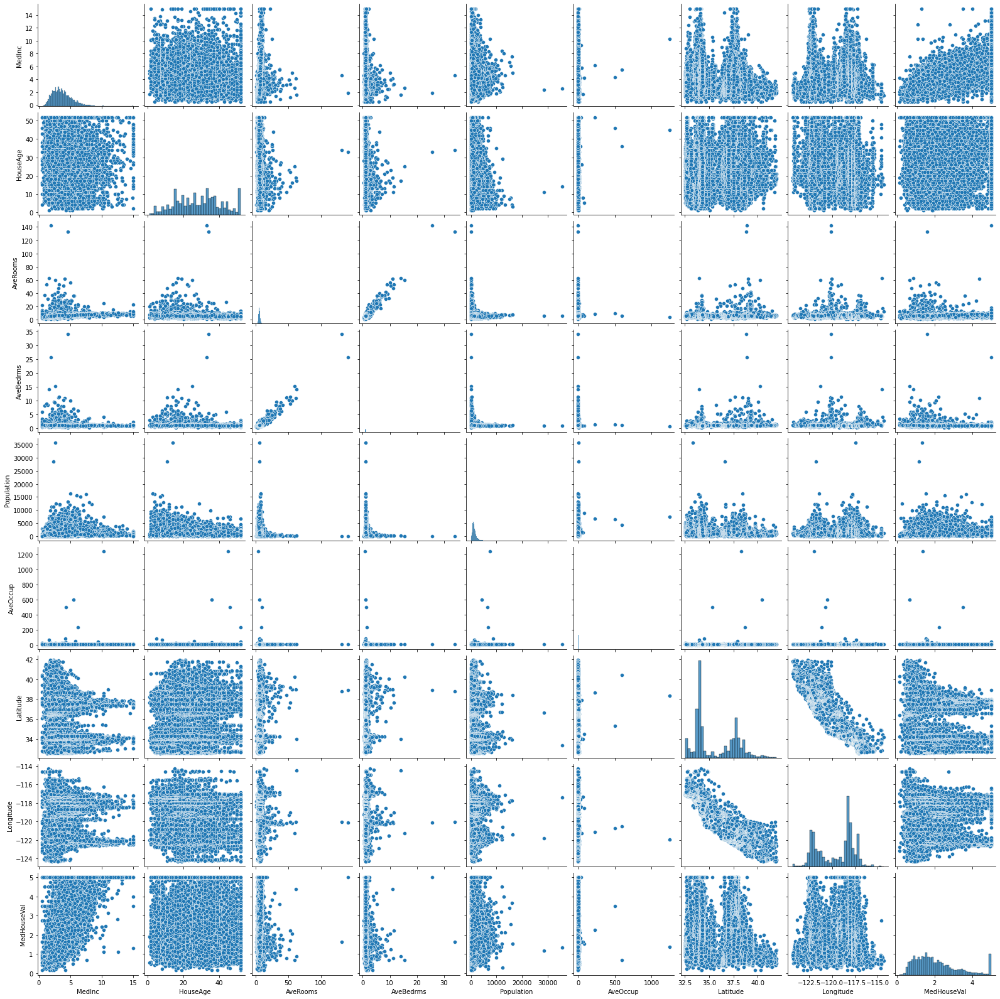

In [ ]:
# display pairwise plots in seaborn
sn.pairplot(california.frame);

# Create training and validation sets

In [ ]:
print("Before:\nData = %s\nTarget = %s" % (california.data.shape, california.target.shape))
from sklearn.model_selection import train_test_split
# split the data and target into training and validation sets
data_train, data_valid, target_train, target_valid = train_test_split(california.data, california.target, test_size=0.3, random_state=0)
# verify sizes
print("After:\nTraining Data = %s\nValidation Data = %s" % (data_train.shape, data_valid.shape))
print("Training Target = %s\nValidation Target = %s" % (target_train.shape, target_valid.shape))

Before:
Data = (20640, 8)
Target = (20640,)
After:
Training Data = (14448, 8)
Validation Data = (6192, 8)
Training Target = (14448,)
Validation Target = (6192,)


# ML Modeling
Multiple Linear Regression (MLR)

In [ ]:
from sklearn.linear_model import LinearRegression
# create mlr model
mlr = LinearRegression()
# fit the training data
mlr.fit(data_train, target_train)

LinearRegression()

In [ ]:
print("Variables = %s" % data_train.columns.tolist())
print("Coefficients = %s" % mlr.coef_)
print("Intercept = %f" % mlr.intercept_)
print("R2 for training = %.5f" % mlr.score(data_train, target_train))
print("R2 for validation = %.5f" % mlr.score(data_valid, target_valid))

Variables = ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude']
Coefficients = [ 4.46773975e-01  9.18409990e-03 -1.18116775e-01  6.42290879e-01
 -9.37026507e-06 -4.08535934e-03 -4.09023312e-01 -4.23419564e-01]
Intercept = -36.012229
R2 for training = 0.61129
R2 for validation = 0.59261
